# Physics Loss Investigation Adaptive Physics - Two Stages Approach.

In [1]:
import numpy as np
import pandas as pd
import torch
import torch.optim as optim
import os
import matplotlib.pyplot as plt
from torch.utils.data import Dataset, DataLoader
from sklearn.model_selection import TimeSeriesSplit
from sklearn.preprocessing import StandardScaler

import pvlib
from pvlib import location, pvsystem, modelchain
from pvlib.temperature import TEMPERATURE_MODEL_PARAMETERS
import re
from pvlib import location, pvsystem, modelchain
from pvlib.modelchain import ModelChain
import os


from pre_processing import calculate_clearsky_indices, calculate_nwp_power, get_station_metadata


In [2]:
# ==========================================================
# Real Power PV generated power data.

# read the data for PVOD
abs_path = os.path.abspath("/home/muhammadhassan/App_v02/physics_informed_inves/PVODdatasets_v1")

station07_path = os.path.join(abs_path, "station07.csv")
station07_data = pd.read_csv(station07_path)

metadata_path = os.path.join(abs_path, "metadata.csv")
metaData = pd.read_csv(metadata_path)


station07_metaData = get_station_metadata(7, metaData)
station07_data = pd.read_csv(station07_path)

In [3]:



# 3. Run Calculation
print(station07_metaData)
station07_df = calculate_clearsky_indices(station07_metaData, station07_data)

{'Station_ID': 'station07', 'Longitude': 113.64187, 'Latitude': 36.64403, 'Array_Tilt': 'South 31°', 'Capacity': 20000.0, 'Panel_Size': 1.6335, 'Total_Panel_Number': 80000, 'PV_Technology': 'Poly-Si', 'Module_Pmax': 250.0, 'Module_Vmpp': 29.8, 'Module_Impp': 8.39, 'Inverter_Rated_Power': 500.0, 'Inverter_Max_DC_Voltage': 1000.0, 'Modules_per_String': 20, 'Strings_per_Inverter': 100}
--- Processing station07 ---
Calculating Clear Sky Irradiance (Ineichen model)...
Running PV Power Simulation...


In [4]:
station07_df = calculate_nwp_power(station07_metaData, station07_df)

--- Calculating NWP Physical Power & Sun Elevation for station07 ---
Running ModelChain with NWP Weather...
Done. Mean Predicted Power: 3.2083 MW | Sun Elevation calculated.


In [5]:
station07_df.columns

Index(['nwp_globalirrad', 'nwp_directirrad', 'nwp_temperature', 'nwp_humidity',
       'nwp_windspeed', 'nwp_winddirection', 'nwp_pressure', 'lmd_totalirrad',
       'lmd_diffuseirrad', 'lmd_temperature', 'lmd_pressure',
       'lmd_winddirection', 'lmd_windspeed', 'power', 'GHI_clr', 'K_CS_day',
       'K_CS_dayNight', 'K_CS', 'P_CLR', 'K_PV', 'sun_elevation',
       'NWP_Power_MW'],
      dtype='object')

In [6]:
def prepare_features(df):
    data = df.copy()
    
    # ---------------------------------------------------------
    # FIX: Convert UTC Index to Local Time (UTC+8)
    # This aligns visual expectations (00:00 = Night, 12:00 = Noon)
    # ---------------------------------------------------------
    if data.index.tzinfo is not None:  # If index is timezone-aware (it is UTC)
        data.index = data.index.tz_convert('Asia/Shanghai')
    else:
        # Fallback: if index somehow became naive, localize as UTC first
        data.index = data.index.tz_localize('UTC').tz_convert('Asia/Shanghai')

    # Now 'data.index' is in Local Time (e.g., Asia/Shanghai)
    
    # 1. Cyclic Encoding for Hour (0-23)
    # This helps the model know that 23:00 is close to 00:00
    data['hour_sin'] = np.sin(2 * np.pi * data.index.hour / 24)
    data['hour_cos'] = np.cos(2 * np.pi * data.index.hour / 24)
    
    # 2. Cyclic Encoding for Day of Year (1-365)
    # This captures seasonality (Summer vs Winter)
    data['day_sin'] = np.sin(2 * np.pi * data.index.dayofyear / 365)
    data['day_cos'] = np.cos(2 * np.pi * data.index.dayofyear / 365)

    # 3. Months
    data['month_sin'] = np.sin(2 * np.pi * data.index.month / 12)
    data['month_cos'] = np.cos(2 * np.pi * data.index.month / 12)

    # seasons 
    data['season_sin'] = np.sin(2 * np.pi * data.index.month / 4)
    data['season_cos'] = np.cos(2 * np.pi * data.index.month / 4)
    
    return data


station07_df = prepare_features(station07_df)




In [7]:
station07_df.columns

Index(['nwp_globalirrad', 'nwp_directirrad', 'nwp_temperature', 'nwp_humidity',
       'nwp_windspeed', 'nwp_winddirection', 'nwp_pressure', 'lmd_totalirrad',
       'lmd_diffuseirrad', 'lmd_temperature', 'lmd_pressure',
       'lmd_winddirection', 'lmd_windspeed', 'power', 'GHI_clr', 'K_CS_day',
       'K_CS_dayNight', 'K_CS', 'P_CLR', 'K_PV', 'sun_elevation',
       'NWP_Power_MW', 'hour_sin', 'hour_cos', 'day_sin', 'day_cos',
       'month_sin', 'month_cos', 'season_sin', 'season_cos'],
      dtype='object')

In [9]:
import importlib
import pre_processing
importlib.reload(pre_processing)
from pre_processing import plot_nwp_vs_actual_interactive

fig = plot_nwp_vs_actual_interactive(station07_df)
fig.show()

---

In [11]:
# ==============================================================================
# CELL 1: Import the Physics-Residual Mamba Module
# ==============================================================================
import sys
sys.path.insert(0, '/home/muhammadhassan/App_v02/physics_informed_inves/PINNS')

from physics_residual_mamba import (
    PhysicsResidualMamba,
    PhysicsResidualMambaConfigs,
    PhysicsPVLoss,
    FeatureScaler,
    compute_scaler_stats,
    run_physics_residual_cv,
    prepare_rolling_folds as prepare_rolling_folds_physics
)

print("✓ Physics-Residual Mamba module imported successfully")

✓ Physics-Residual Mamba module imported successfully


----

In [12]:
import sys
import importlib
import torch
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# 1. Reload the library (Important if you just edited it)
import physics_residual_mamba
importlib.reload(physics_residual_mamba)
from physics_residual_mamba import *

# 2. Prepare Data
# Ensure station07_df is loaded from previous cells
df_experiment = station07_df.copy()

n_splits = 4
base_configs = PhysicsResidualMambaConfigs(n_splits=n_splits) 
phys_configs = PhysicsResidualMambaConfigs(n_splits=n_splits)

base_configs.epochs = 50
phys_configs.epochs = 50


configs.experiment_mode = 'v0_base' 
base_results, phys_results = run_full_benchmark(
      df_experiment, 
      base_configs, 
      phys_configs,  
      n_splits=n_splits
)

NameError: name 'configs' is not defined

>>> Running 7-Way Comparative Benchmark (Target: K_PV, Persistent Rolling)
Using Custom Configuration Provided by User
DEBUG: Using Total Epochs=30, Warmup=15
DEBUG: df.index is DatetimeIndex. Range: 2018-07-01 00:00:00+08:00 to 2019-06-13 23:45:00+08:00
DEBUG: Fold 1 - test_index head: DatetimeIndex(['2018-09-07 15:00:00+08:00', '2018-09-07 15:15:00+08:00',
               '2018-09-07 15:30:00+08:00', '2018-09-07 15:45:00+08:00',
               '2018-09-07 16:00:00+08:00'],
              dtype='datetime64[ns, Asia/Shanghai]', name='date_time', freq=None)
DEBUG: Fold 1 - test_index tail: DatetimeIndex(['2018-11-15 04:00:00+08:00', '2018-11-15 04:15:00+08:00',
               '2018-11-15 04:30:00+08:00', '2018-11-15 04:45:00+08:00',
               '2018-11-15 05:00:00+08:00'],
              dtype='datetime64[ns, Asia/Shanghai]', name='date_time', freq=None)

=== Fold 1/4 ===
Train: 2018-07-01 00:00:00+08:00 -> 2018-09-07 14:45:00+08:00
Test : 2018-09-07 15:00:00+08:00 -> 2018-11-15 05:00:

DEBUG: Fold 2 - test_index head: DatetimeIndex(['2018-11-15 05:15:00+08:00', '2018-11-15 05:30:00+08:00',
               '2018-11-15 05:45:00+08:00', '2018-11-15 06:00:00+08:00',
               '2018-11-15 06:15:00+08:00'],
              dtype='datetime64[ns, Asia/Shanghai]', name='date_time', freq=None)
DEBUG: Fold 2 - test_index tail: DatetimeIndex(['2019-01-22 18:15:00+08:00', '2019-01-22 18:30:00+08:00',
               '2019-01-22 18:45:00+08:00', '2019-01-22 19:00:00+08:00',
               '2019-01-22 19:15:00+08:00'],
              dtype='datetime64[ns, Asia/Shanghai]', name='date_time', freq=None)

=== Fold 2/4 ===
Train: 2018-07-01 00:00:00+08:00 -> 2018-11-15 05:00:00+08:00
Test : 2018-11-15 05:15:00+08:00 -> 2019-01-22 19:15:00+08:00
Training Vanilla Mamba... Done. RMSE: 1.488 MW | nRMSE: 7.44% | Time: 71.7s
Training Base Power Mamba... Done. RMSE: 1.526 MW | nRMSE: 7.63% | Time: 75.0s
Training Physics V02 (Basic)... Done. RMSE: 1.383 MW | nRMSE: 6.91% | Time: 67.1s
Training 

DEBUG: Fold 3 - test_index head: DatetimeIndex(['2019-01-22 19:30:00+08:00', '2019-01-22 19:45:00+08:00',
               '2019-01-22 20:00:00+08:00', '2019-01-22 20:15:00+08:00',
               '2019-01-22 20:30:00+08:00'],
              dtype='datetime64[ns, Asia/Shanghai]', name='date_time', freq=None)
DEBUG: Fold 3 - test_index tail: DatetimeIndex(['2019-04-06 08:30:00+08:00', '2019-04-06 08:45:00+08:00',
               '2019-04-06 09:00:00+08:00', '2019-04-06 09:15:00+08:00',
               '2019-04-06 09:30:00+08:00'],
              dtype='datetime64[ns, Asia/Shanghai]', name='date_time', freq=None)

=== Fold 3/4 ===
Train: 2018-07-01 00:00:00+08:00 -> 2019-01-22 19:15:00+08:00
Test : 2019-01-22 19:30:00+08:00 -> 2019-04-06 09:30:00+08:00
Training Vanilla Mamba... Done. RMSE: 2.380 MW | nRMSE: 11.90% | Time: 108.0s
Training Base Power Mamba... Done. RMSE: 2.254 MW | nRMSE: 11.27% | Time: 105.9s
Training Physics V02 (Basic)... Done. RMSE: 1.944 MW | nRMSE: 9.72% | Time: 95.3s
Train

DEBUG: Fold 4 - test_index head: DatetimeIndex(['2019-04-06 09:45:00+08:00', '2019-04-06 10:00:00+08:00',
               '2019-04-06 10:15:00+08:00', '2019-04-06 10:30:00+08:00',
               '2019-04-06 10:45:00+08:00'],
              dtype='datetime64[ns, Asia/Shanghai]', name='date_time', freq=None)
DEBUG: Fold 4 - test_index tail: DatetimeIndex(['2019-06-13 22:45:00+08:00', '2019-06-13 23:00:00+08:00',
               '2019-06-13 23:15:00+08:00', '2019-06-13 23:30:00+08:00',
               '2019-06-13 23:45:00+08:00'],
              dtype='datetime64[ns, Asia/Shanghai]', name='date_time', freq=None)

=== Fold 4/4 ===
Train: 2018-07-01 00:00:00+08:00 -> 2019-04-06 09:30:00+08:00
Test : 2019-04-06 09:45:00+08:00 -> 2019-06-13 23:45:00+08:00
Training Vanilla Mamba... Done. RMSE: 2.084 MW | nRMSE: 10.42% | Time: 140.1s
Training Base Power Mamba... Done. RMSE: 2.324 MW | nRMSE: 11.62% | Time: 142.7s
Training Physics V02 (Basic)... Done. RMSE: 2.044 MW | nRMSE: 10.22% | Time: 123.2s
Tra


>>> FINAL RESULTS (Average across folds) <<<
Vanilla Mamba: RMSE=1.937 | nRMSE=9.69%
Base Power Mamba: RMSE=2.027 | nRMSE=10.14%
Physics V02 (Basic): RMSE=1.763 | nRMSE=8.82%
Physics V03 (Geo): RMSE=1.800 | nRMSE=9.00%
Physics V04 (Robust): RMSE=1.770 | nRMSE=8.85%
Smart Persistence: RMSE=2.283 | nRMSE=11.41%
NWP Baseline: RMSE=2.215 | nRMSE=11.07%
Physics Pure: RMSE=1.696 | nRMSE=8.48%


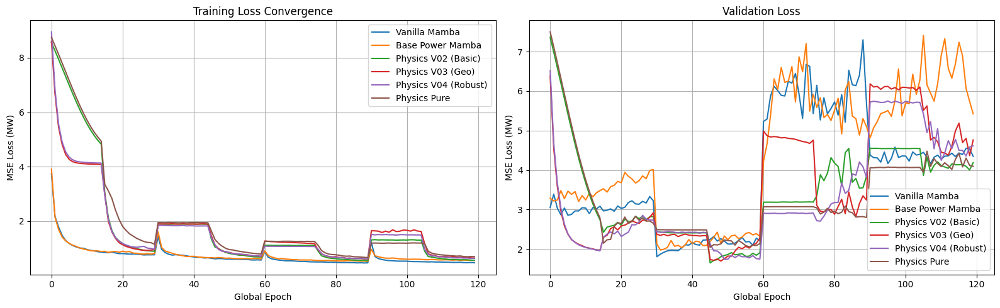

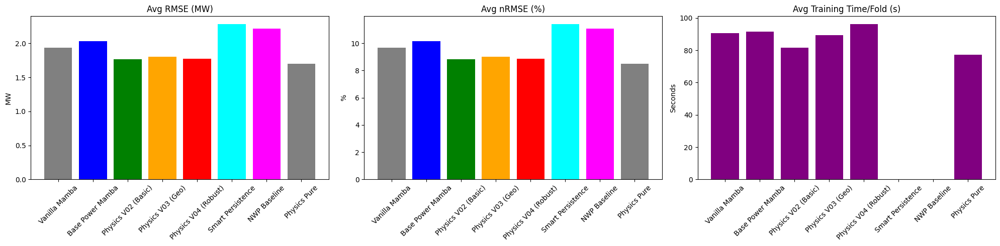

In [ ]:
# ==============================================================================
# CELL 3: Configure Models for Comparison
# ==============================================================================

class BaseMambaConfigs:
    """Configuration for base Power Mamba (no physics)."""
    def __init__(self):
        self.seq_len = 288
        self.pred_len = 96
        
        self.TARGET_COL = ['K_PV'] 
        
        self.PAST_INPUT_COLS = ['lmd_totalirrad',
       'lmd_diffuseirrad', 'lmd_temperature', 'nwp_globalirrad',
            'nwp_temperature','P_CLR', 
            'nwp_windspeed', 'power', 'K_PV', 'hour_sin',
       'hour_cos', 'day_sin', 'day_cos', 'month_sin', 'month_cos',
       'season_sin', 'season_cos', 'K_CS'
        ]
        
        self.FUTURE_INPUT_COLS = ['nwp_globalirrad', 'nwp_temperature', 'nwp_windspeed', 'hour_sin',
       'hour_cos', 'day_sin', 'day_cos', 'month_sin', 'month_cos',
       'season_sin', 'season_cos', 'K_CS']
        
        self.common_features = [f for f in self.FUTURE_INPUT_COLS if f in self.PAST_INPUT_COLS]
        self.num_shadows = len(self.common_features)
        self.include_pred = 1
        self.enc_in = len(self.PAST_INPUT_COLS) + self.num_shadows
        self.c_out = 1
        
        # Model hyperparameters
        self.kernel_size = 25
        self.n_embed = 128
        self.d_state = 64
        self.dconv = 2
        self.e_fact = 2 
        self.dropout = 0.2 
        
        # Training
        self.n_splits = 4
        self.batch_size = 32
        self.epochs = 5
        
        # Device
        self.device = torch.device("cuda" if torch.cuda.is_available() else "cpu")


# Run Comparative Benchmark
# This will:
# 1. Train the V0 Model (Target=Power)
# 2. Train the V02 Model (Target=K_PV)
# 3. Report RMSE (MW) for both on the same data splits
# 4. Print the % improvement
  
import physics_residual_mamba_v02 as v02


# Instantiate your config
my_config = BaseMambaConfigs()
my_config.epochs = 30  # Override as needed
# Run benchmark with your config

my_config.warmup_epochs = 15
df_experiment = station07_df.copy()
results = v02.run_comparative_benchmark(
    df_experiment, 
    n_splits=4, 
    custom_config=my_config
)

---

In [ ]:
# ==========================================================
# STEP 1: Load Station 08 Data (same process as Station 07)
# ==========================================================

station08_path = os.path.join(abs_path, "station08.csv")
station08_data = pd.read_csv(station08_path)

station08_metaData = get_station_metadata(8, metaData)

# Calculate clearsky indices and NWP power for Station 08
station08_df = calculate_clearsky_indices(station08_metaData, station08_data)
station08_df = calculate_nwp_power(station08_metaData, station08_df)
station08_df = prepare_features(station08_df)

# ==========================================================
# STEP 2: Rename Station 08 columns with 's08_' prefix
# ==========================================================

# Columns to rename (NWP features and K_PV from Station 08)
s08_rename_cols = {
    'nwp_globalirrad': 's08_nwp_globalirrad',
    'nwp_temperature': 's08_nwp_temperature',
    'nwp_windspeed': 's08_nwp_windspeed',
    'K_PV': 's08_K_PV',
}

# Create a subset with renamed columns
station08_spatial = station08_df[list(s08_rename_cols.keys())].rename(columns=s08_rename_cols)

# ==========================================================
# STEP 3: Merge on DateTime Index
# ==========================================================

# Both dataframes should have the same DatetimeIndex after prepare_features()
merged_df = station07_df.copy()

# Join Station 08 features
merged_df = merged_df.join(station08_spatial, how='inner')

# ==========================================================
# STEP 4: Calculate Spatial Deltas (Station07 - Station08)
# ==========================================================

merged_df['spatial_delta_irrad'] = merged_df['nwp_globalirrad'] - merged_df['s08_nwp_globalirrad']
merged_df['spatial_delta_temp'] = merged_df['nwp_temperature'] - merged_df['s08_nwp_temperature']
merged_df['spatial_delta_wind'] = merged_df['nwp_windspeed'] - merged_df['s08_nwp_windspeed']

# ==========================================================
# STEP 5: Verify Columns
# ==========================================================

print("=== Merged DataFrame Columns ===")
print(f"Total columns: {len(merged_df.columns)}")
print(f"Station 07 columns: {[c for c in merged_df.columns if not c.startswith('s08_') and not c.startswith('spatial_')]}")
print(f"Station 08 columns: {[c for c in merged_df.columns if c.startswith('s08_')]}")
print(f"Spatial deltas: {[c for c in merged_df.columns if c.startswith('spatial_')]}")
print(f"\nShape: {merged_df.shape}")

# ==========================================================
# STEP 6: Run Spatial Benchmark
# ==========================================================

from physics_residual_mamba_spatial_v02 import run_comparative_benchmark, SpatialMambaConfigs


class SpatialMambaConfigs:
    def __init__(self, n_splits=4):
        self.seq_len = 288
        self.pred_len = 96
        self.TARGET_COL = ['K_PV']
        self.PAST_INPUT_COLS = ['nwp_globalirrad', 'nwp_temperature', 'nwp_windspeed', 'power', 'K_PV', 'P_CLR', 'NWP_Power_MW', 'hour_sin', 'hour_cos', 'sun_elevation', 'K_CS', 's08_nwp_globalirrad', 's08_nwp_temperature', 's08_nwp_windspeed', 's08_K_PV', 'spatial_delta_irrad', 'spatial_delta_temp', 'spatial_delta_wind']
        self.FUTURE_INPUT_COLS = ['nwp_globalirrad', 'nwp_temperature', 'nwp_windspeed', 'NWP_Power_MW', 'hour_sin', 'hour_cos', 'sun_elevation', 'K_CS', 's08_nwp_globalirrad', 's08_nwp_temperature', 's08_nwp_windspeed', 'spatial_delta_irrad', 'spatial_delta_temp', 'spatial_delta_wind']
        st07_future_cols = ['nwp_globalirrad', 'nwp_temperature', 'nwp_windspeed', 'NWP_Power_MW', 'hour_sin', 'hour_cos', 'sun_elevation']
        self.st07_indices = [self.FUTURE_INPUT_COLS.index(c) for c in st07_future_cols]
        self.st07_future_cols = st07_future_cols
        
        self.common_features = [f for f in self.FUTURE_INPUT_COLS if f in self.PAST_INPUT_COLS]
        self.num_shadows = len(self.common_features)
        self.enc_in = len(self.PAST_INPUT_COLS) + self.num_shadows
        self.c_out = 1
        
        self.kernel_size = 25
        self.n_embed = 128
        self.d_state = 64
        self.dconv = 2
        self.e_fact = 2
        self.dropout = 0.2
        self.n_splits = n_splits
        self.batch_size = 64
        self.epochs = 30
        self.warmup_epochs = 5
        # Loss params
        self.T_ref = 25.0
        self.device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
        

# Configure with same warmup as V02
my_spatial_config = SpatialMambaConfigs(n_splits=4)
my_spatial_config.warmup_epochs = 25 
my_spatial_config.epochs = 50
# Run Benchmark
results_spatial = run_comparative_benchmark(
    merged_df, 
    n_splits=4, 
    custom_config=my_spatial_config
)

--- Processing station08 ---
Calculating Clear Sky Irradiance (Ineichen model)...
Running PV Power Simulation...
--- Calculating NWP Physical Power & Sun Elevation for station08 ---
Running ModelChain with NWP Weather...
Done. Mean Predicted Power: 2.7035 MW | Sun Elevation calculated.
=== Merged DataFrame Columns ===
Total columns: 37
Station 07 columns: ['nwp_globalirrad', 'nwp_directirrad', 'nwp_temperature', 'nwp_humidity', 'nwp_windspeed', 'nwp_winddirection', 'nwp_pressure', 'lmd_totalirrad', 'lmd_diffuseirrad', 'lmd_temperature', 'lmd_pressure', 'lmd_winddirection', 'lmd_windspeed', 'power', 'GHI_clr', 'K_CS_day', 'K_CS_dayNight', 'K_CS', 'P_CLR', 'K_PV', 'sun_elevation', 'NWP_Power_MW', 'hour_sin', 'hour_cos', 'day_sin', 'day_cos', 'month_sin', 'month_cos', 'season_sin', 'season_cos']
Station 08 columns: ['s08_nwp_globalirrad', 's08_nwp_temperature', 's08_nwp_windspeed', 's08_K_PV']
Spatial deltas: ['spatial_delta_irrad', 'spatial_delta_temp', 'spatial_delta_wind']

Shape: (326

----

In [ ]:
# ... (Your Data Preparation Steps 1-5 remain exactly the same) ...

# ==========================================================
# STEP 6: Run V05 Benchmark (No Wavelet)
# ==========================================================

# 1. IMPORT from the NEW V05 file
from physics_residual_mamba_spatial_v05 import run_comparative_benchmark, SpatialMambaConfigs

class SpatialMambaConfigs:
    def __init__(self, n_splits=4):
        self.seq_len = 288
        self.pred_len = 96
        self.TARGET_COL = ['K_PV']
        self.PAST_INPUT_COLS = ['nwp_globalirrad', 'nwp_temperature', 'nwp_windspeed', 'power', 'K_PV', 'P_CLR', 'NWP_Power_MW', 'hour_sin', 'hour_cos', 'sun_elevation', 'K_CS', 's08_nwp_globalirrad', 's08_nwp_temperature', 's08_nwp_windspeed', 's08_K_PV', 'spatial_delta_irrad', 'spatial_delta_temp', 'spatial_delta_wind']
        self.FUTURE_INPUT_COLS = ['nwp_globalirrad', 'nwp_temperature', 'nwp_windspeed', 'NWP_Power_MW', 'hour_sin', 'hour_cos', 'sun_elevation', 'K_CS', 's08_nwp_globalirrad', 's08_nwp_temperature', 's08_nwp_windspeed', 'spatial_delta_irrad', 'spatial_delta_temp', 'spatial_delta_wind']
        st07_future_cols = ['nwp_globalirrad', 'nwp_temperature', 'nwp_windspeed', 'NWP_Power_MW', 'hour_sin', 'hour_cos', 'sun_elevation']
        self.st07_indices = [self.FUTURE_INPUT_COLS.index(c) for c in st07_future_cols]
        self.st07_future_cols = st07_future_cols
        
        self.common_features = [f for f in self.FUTURE_INPUT_COLS if f in self.PAST_INPUT_COLS]
        self.num_shadows = len(self.common_features)
        self.enc_in = len(self.PAST_INPUT_COLS) + self.num_shadows
        self.c_out = 1
        
        self.kernel_size = 25
        self.n_embed = 128
        self.d_state = 64
        self.dconv = 2
        self.e_fact = 2
        self.dropout = 0.2
        self.n_splits = n_splits
        self.batch_size = 64
        self.epochs = 30
        self.warmup_epochs = 5
        # Loss params
        self.T_ref = 25.0
        self.device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
        
# 2. Configure
my_spatial_config = SpatialMambaConfigs(n_splits=2)
my_spatial_config.warmup_epochs = 25
my_spatial_config.epochs = 50

# 3. Run Benchmark
# This will automatically run:
# - Vanilla Mamba
# - Base Power Mamba
# - Physics V04 (Robust)
# - Physics V05 (Hyper-Robust)
# - Smart Persistence
# - NWP Baseline
results_spatial = run_comparative_benchmark(
    merged_df, 
    n_splits=2, 
    custom_config=my_spatial_config
) 

>>> Running V05 Benchmark (No Wavelet, Fixed Loss, Adaptive Removed)

=== Fold 1/2 ===
Training Vanilla Mamba... RMSE: 1.000 MW | nRMSE: 5.00%
Training Base Power Mamba... RMSE: 0.970 MW | nRMSE: 4.85%
Training Physics V04 (Robust)... RMSE: 0.942 MW | nRMSE: 4.71%
Training Physics V05 (Hyper-Robust)... RMSE: 1.025 MW | nRMSE: 5.12%
Training Smart Persistence... RMSE: 1.968 MW | nRMSE: 9.84%
Training NWP Baseline... RMSE: 2.446 MW | nRMSE: 12.23%

=== Fold 2/2 ===
Training Vanilla Mamba... RMSE: 1.256 MW | nRMSE: 6.28%
Training Base Power Mamba... RMSE: 1.259 MW | nRMSE: 6.29%
Training Physics V04 (Robust)... RMSE: 1.271 MW | nRMSE: 6.36%
Training Physics V05 (Hyper-Robust)... RMSE: 1.319 MW | nRMSE: 6.60%
Training Smart Persistence... RMSE: 2.660 MW | nRMSE: 13.30%
Training NWP Baseline... RMSE: 2.145 MW | nRMSE: 10.73%

>>> FINAL RESULTS <<<
Vanilla Mamba: RMSE=1.128 | nRMSE=5.64%
Base Power Mamba: RMSE=1.115 | nRMSE=5.57%
Physics V04 (Robust): RMSE=1.107 | nRMSE=5.53%
Physics V05 (Hy

----

Loading Metadata...
Loading Station 07 from /home/muhammadhassan/App_v02/physics_informed_inves/PVODdatasets_v1/station07.csv...
Pre-processing Station 07...
--- Processing station07 ---
Calculating Clear Sky Irradiance (Ineichen model)...
Setting up PV System Model...
Running PV Power Simulation...
--- Calculating NWP Physical Power for station07 ---
Running ModelChain with NWP Weather...
Adding Sun Elevation...
Loading Station 08 from /home/muhammadhassan/App_v02/physics_informed_inves/PVODdatasets_v1/station08.csv...
Pre-processing Station 08...
--- Processing station08 ---
Calculating Clear Sky Irradiance (Ineichen model)...
Setting up PV System Model...
Running PV Power Simulation...
--- Calculating NWP Physical Power for station08 ---
Running ModelChain with NWP Weather...
Merging Spatial Data...
Final Merged Shape: (32640, 35)
=== STATION GEOMETRY ===
Station 07: (36.64403°N, 113.64187°E)
Station 08: (36.70761°N, 113.69999°E)
Calculated Bearing (08→07): 216.26°
Calculated Distan

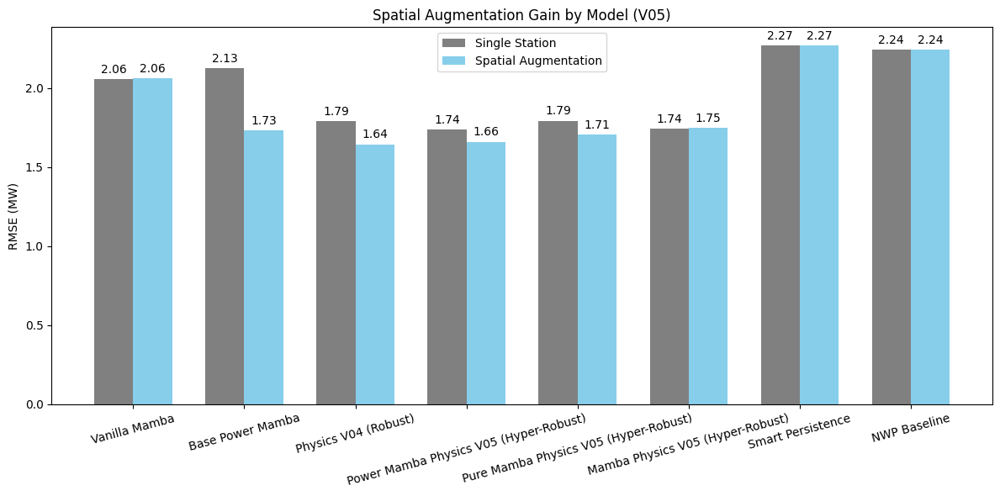

In [1]:
from v05_experiment_runner import main as v05_main
v05_main()

----